In [1]:
from sea_breeze import load_model_data, utils, sea_breeze_funcs
import xarray as xr
from dask.distributed import Client
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import logging
import datetime as dt
import pandas as pd

logging.getLogger("flox").setLevel(logging.WARNING)

In [2]:
def preprocess(ds):
    ds["time"] = pd.to_datetime(ds.time) + dt.timedelta(hours=11)
    #return ds["mask"].resample({"time":"1D"}).max()
    return ds["mask"].groupby(ds.time.dt.date).max()

def load_hourly(model,lat_slice,lon_slice,diagnostic,lt_offset,chunks={"time":10}):

    ds = xr.open_mfdataset("/g/data/ng72/ab4502/sea_breeze_detection/"+\
                      model+\
                      "/filters/filtered_mask_no_hourly_change_"+\
                      diagnostic+\
                      "_*.zarr/",
                 chunks=chunks, engine="zarr").sel(lat=lat_slice,lon=lon_slice)
    ds["time"] = pd.to_datetime(ds.time) + dt.timedelta(hours=lt_offset)
    
    return ds

def count_num_of_objs(da):
    x = np.unique(da)
    x = x[x!=0]
    x = x[~np.isnan(x)]
    return len(x)

def mask(ds,angle_ds,mask=True,mask_thresh=0.5):
    return xr.where(angle_ds.variance_interp<mask_thresh, ds, np.nan)    

def load_data(lat_slice,lon_slice,sb_lat_slice=None,sb_lon_slice=None):
        
    m="aus2200"
    angle_ds = load_model_data.get_coastline_angle_kernel(
        compute=False,
        path_to_load="/g/data/ng72/ab4502/coastline_data/"+m+".nc",
        lat_slice=lat_slice,
        lon_slice=lon_slice
    )
    orog,lsm = load_model_data.load_aus2200_static("mjo-elnino2016",lon_slice,lat_slice)   

    lst_offset = np.round(np.mean(lsm.lon.values) / 180 * 12)

    m = "aus2200_smooth_s4"
    c = {}
    
    F_hourly = load_hourly(m,lat_slice,lon_slice,"F",lst_offset,chunks=c)
    F_hourly = xr.where((F_hourly.time.dt.hour < 9) | (F_hourly.time.dt.hour > 21), 0, F_hourly)
    F = F_hourly.groupby(F_hourly.time.dt.date).max().persist()
    
    sbi_hourly = load_hourly(m,lat_slice,lon_slice,"sbi",lst_offset,chunks=c)
    sbi_hourly = xr.where((sbi_hourly.time.dt.hour < 9) | (sbi_hourly.time.dt.hour > 21), 0, sbi_hourly)
    sbi = sbi_hourly.groupby(sbi_hourly.time.dt.date).max().persist()

    #Define sea breeze days where at least one of the grid points within 50 km of the coastline have a sea breeze object
    if sb_lat_slice is None:
        sb_lat_slice = lat_slice
    if sb_lon_slice is None:
        sb_lon_slice = lon_slice
    F_sb_ts = (xr.where(
        (angle_ds.min_coast_dist<=50), F.mask, np.nan
        ).sel(lat=sb_lat_slice,lon=sb_lon_slice).mean(("lat","lon")) > 0.0).values
    sbi_sb_ts = (xr.where(
        (angle_ds.min_coast_dist<=50), sbi.mask, np.nan
        ).sel(lat=sb_lat_slice,lon=sb_lon_slice).mean(("lat","lon")) > 0.0).values    

    #Load model data for the period
    uas = []
    vas = []
    tas = []
    hus = []
    times = [("2013-01-01 00:00","2013-02-28 23:00"),
             ("2016-01-01 00:00","2016-02-29 23:00"),
             ("2018-01-01 00:00","2018-02-28 23:00")]
    expid = ["mjo-neutral2013","mjo-elnino2016","mjo-lanina2018"]
    for t,e in zip(times,expid):
    
        vas.append(load_model_data.load_aus2200_variable(
                    "vas",
                    t[0],
                    t[1],
                    e,
                    lon_slice,
                    lat_slice,
                    "1hr",
                    staggered="lat",
                    chunks={}))
    
        uas.append(load_model_data.load_aus2200_variable(
                    "uas",
                    t[0],
                    t[1],
                    e,
                    lon_slice,
                    lat_slice,
                    staggered="lon",
                    freq="1hr",
                    chunks={}))
    
        tas.append(load_model_data.load_aus2200_variable(
                    "tas",
                    t[0],
                    t[1],
                    e,
                    lon_slice,
                    lat_slice,
                    freq="1hr",
                    chunks={}))
    
        hus.append(load_model_data.load_aus2200_variable(
                    "huss",
                    t[0],
                    t[1],
                    e,
                    lon_slice,
                    lat_slice,
                    freq="1hr",
                    chunks={}))
        
    vas = xr.concat(vas,dim="time")
    uas = xr.concat(uas,dim="time")
    tas = xr.concat(tas,dim="time")
    hus = xr.concat(hus,dim="time")

    #Add local time offset
    uas["time"] = pd.to_datetime(uas.time) + dt.timedelta(hours=lst_offset)
    vas["time"] = pd.to_datetime(vas.time) + dt.timedelta(hours=lst_offset)
    tas["time"] = pd.to_datetime(tas.time) + dt.timedelta(hours=lst_offset)
    hus["time"] = pd.to_datetime(hus.time) + dt.timedelta(hours=lst_offset)    

    #Composite the model data over the sea breeze days defined by F
    sb_hourly_times = (np.in1d(uas.time.dt.date,F.date[F_sb_ts.astype(bool)]))
    tas_F_sb_comp = tas.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    hus_F_sb_comp = hus.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    vas_F_sb_comp = vas.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    uas_F_sb_comp = uas.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    uprime_F_sb_comp,vprime_F_sb_comp=sea_breeze_funcs.rotate_wind(uas_F_sb_comp,vas_F_sb_comp,angle_ds.angle_interp)
    F_sb_comp = {"tas":tas_F_sb_comp,
                 "hus":hus_F_sb_comp,
                 "uas":uas_F_sb_comp,
                 "vas":vas_F_sb_comp,
                 "vprime":vprime_F_sb_comp}

    #Composite the model data over non sea breeze days defined by F
    nonsb_hourly_times = (np.in1d(uas.time.dt.date,F.date[~F_sb_ts.astype(bool)]))
    hus_F_nonsb_comp = hus.sel(time=nonsb_hourly_times).groupby("time.hour").mean().persist()
    tas_F_nonsb_comp = tas.sel(time=nonsb_hourly_times).groupby("time.hour").mean().persist()
    vas_F_nonsb_comp = vas.sel(time=nonsb_hourly_times).groupby("time.hour").mean().persist()
    uas_F_nonsb_comp = uas.sel(time=nonsb_hourly_times).groupby("time.hour").mean().persist()
    uprime_F_nonsb_comp,vprime_F_nonsb_comp=sea_breeze_funcs.rotate_wind(uas_F_nonsb_comp,vas_F_nonsb_comp,angle_ds.angle_interp)    
    F_non_sb_comp = {"tas":tas_F_nonsb_comp,
                 "hus":hus_F_nonsb_comp,
                 "uas":uas_F_nonsb_comp,
                 "vas":vas_F_nonsb_comp,
                 "vprime":vprime_F_nonsb_comp}

    #Composite the model data over sea breeze days defined by sbi
    sb_hourly_times = (np.in1d(uas.time.dt.date,sbi.date[sbi_sb_ts.astype(bool)]))
    vas_sbi_sb_comp = vas.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    uas_sbi_sb_comp = uas.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()
    uprime_sbi_sb_comp,vprime_sbi_sb_comp=sea_breeze_funcs.rotate_wind(uas_sbi_sb_comp,vas_sbi_sb_comp,angle_ds.angle_interp)
    sbi_sb_comp = {"uas":uas_sbi_sb_comp,
                 "vas":vas_sbi_sb_comp,
                 "vprime":vprime_sbi_sb_comp}
    
    #Composite the model data over non sea breeze days defined by sbi
    non_sb_hourly_times = (np.in1d(uas.time.dt.date,sbi.date[~sbi_sb_ts.astype(bool)]))
    vas_sbi_nonsb_comp = vas.sel(time=non_sb_hourly_times).groupby("time.hour").mean().persist()
    uas_sbi_nonsb_comp = uas.sel(time=non_sb_hourly_times).groupby("time.hour").mean().persist()
    uprime_sbi_nonsb_comp,vprime_sbi_nonsb_comp=sea_breeze_funcs.rotate_wind(uas_sbi_nonsb_comp,vas_sbi_nonsb_comp,angle_ds.angle_interp)
    sbi_nonsb_comp = {"uas":uas_sbi_nonsb_comp,
                 "vas":vas_sbi_nonsb_comp,
                 "vprime":vprime_sbi_nonsb_comp}
    
    return F_hourly, F, sbi_hourly, sbi, angle_ds, lsm, orog, F_sb_ts, sbi_sb_ts, F_sb_comp, F_non_sb_comp, sbi_sb_comp, sbi_nonsb_comp


def plot_bbox(lat_slice,lon_slice):
    plt.plot(
    [lon_slice.start,lon_slice.stop,lon_slice.stop,lon_slice.start,lon_slice.start],
    [lat_slice.start,lat_slice.start,lat_slice.stop,lat_slice.stop,lat_slice.start],
    color="k",
    ls=":"
    )

def plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice):

    xr.plot.contour(
        xr.where(
        (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) &
            (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & 
            (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & 
            (angle_ds.min_coast_dist.lon<sb_lon_slice.stop),
        angle_ds.min_coast_dist,100),
        levels=[50],colors="k",linestyles="--")    

In [3]:
Client()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43305,Workers: 7
Dashboard: /proxy/8787/status,Total threads: 14
Started: Just now,Total memory: 63.00 GiB
Comm: tcp://127.0.0.1:42205,Total threads: 2
Dashboard: /proxy/36169/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:40717,


2025-06-13 13:23:04,255 - distributed.scheduler - WARNING - Detected different `run_spec` for key 'original-open_dataset-mask-d31e2850a26b238c46563728935c38a3' between two consecutive calls to `update_graph`. This can cause failures and deadlocks down the line. Please ensure unique key names. If you are using a standard dask collections, consider releasing all the data before resubmitting another computation. More details and help can be found at https://github.com/dask/dask/issues/9888. 
Debugging information
---------------------
old task state: released
old run_spec: DataNode(original-open_dataset-mask-d31e2850a26b238c46563728935c38a3, type=<class 'xarray.core.indexing.ImplicitToExplicitIndexingAdapter'>, ImplicitToExplicitIndexingAdapter(array=CopyOnWriteArray(array=LazilyIndexedArray(array=BoolTypeArray(array=LazilyIndexedArray(array=<xarray.backends.zarr.ZarrArrayWrapper object at 0x14bfe0fe6500>, key=BasicIndexer((slice(None, None, None), slice(None, None, None), slice(None, Non

In [9]:
lat_slice, lon_slice = utils.get_perth_large_bounds()
sb_lat_slice,sb_lon_slice = utils.get_perth_bounds()
F_hourly, F, sbi_hourly, sbi, angle_ds, lsm, orog, F_sb_ts, sbi_sb_ts, F_sb_comp, F_non_sb_comp, sbi_sb_comp, sbi_nonsb_comp = load_data(lat_slice,lon_slice,sb_lon_slice=sb_lon_slice,sb_lat_slice=sb_lat_slice)

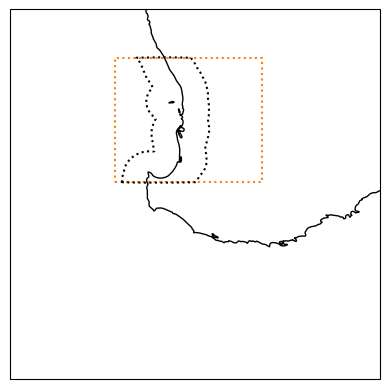

In [50]:
ax=plt.axes(projection=ccrs.PlateCarree())
plt.ylim([lat_slice.start,lat_slice.stop])
plt.xlim([lon_slice.start,lon_slice.stop])
ax.coastlines()

plt.plot(
    [sb_lon_slice.start,sb_lon_slice.stop,sb_lon_slice.stop,sb_lon_slice.start,sb_lon_slice.start],
    [sb_lat_slice.start,sb_lat_slice.start,sb_lat_slice.stop,sb_lat_slice.stop,sb_lat_slice.start],
    color="tab:orange",
    ls=":"
)
xr.plot.contour(
    xr.where(
    (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) &
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & 
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & 
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop),
    angle_ds.min_coast_dist,100),
    levels=[50],colors="k",linestyles=":")

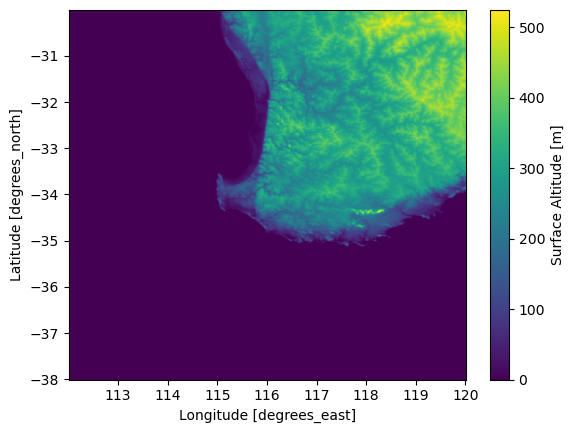

In [131]:
orog.plot()

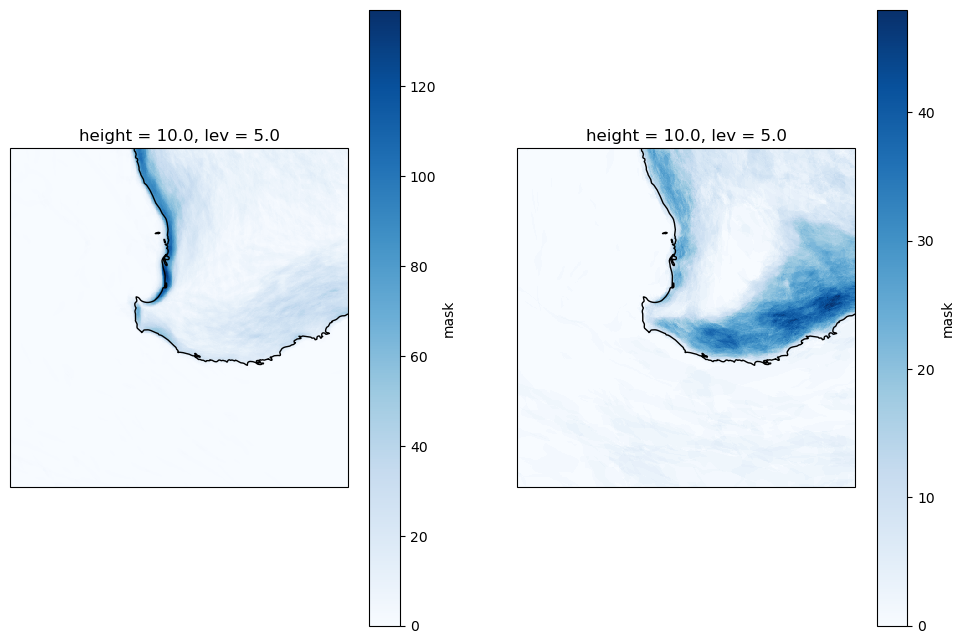

In [11]:
plt.figure(figsize=[12,8])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

In [12]:
print(F_sb_ts.sum(), sbi_sb_ts.sum(), F.date.shape[0])

157 82 181


Text(0.5, 1.0, 'Frequency of SBI objects on F non-SB days')

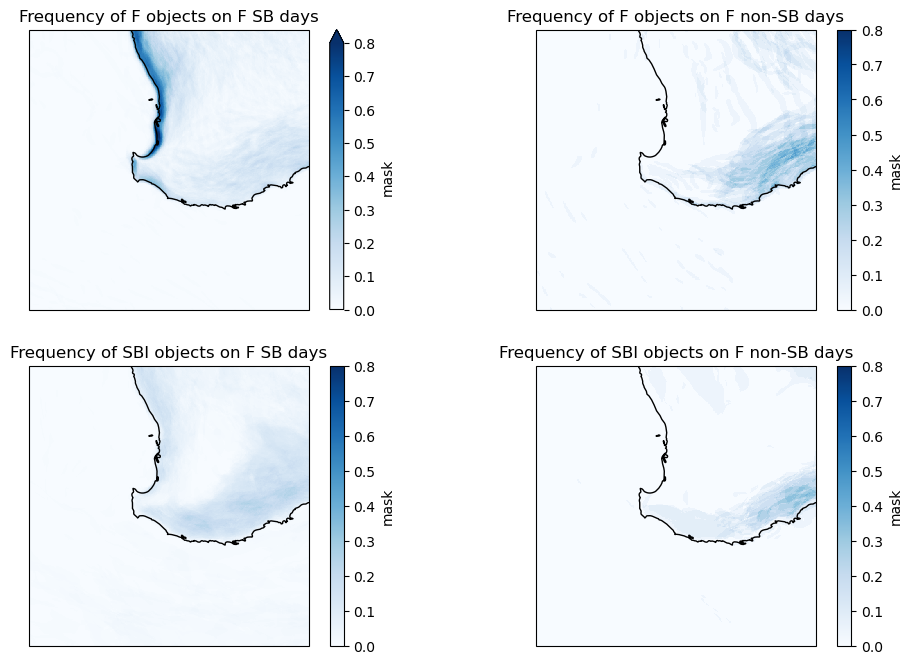

In [13]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F non-SB days")

Text(0.5, 1.0, 'Frequency of SBI objects on SBI non-SB days')

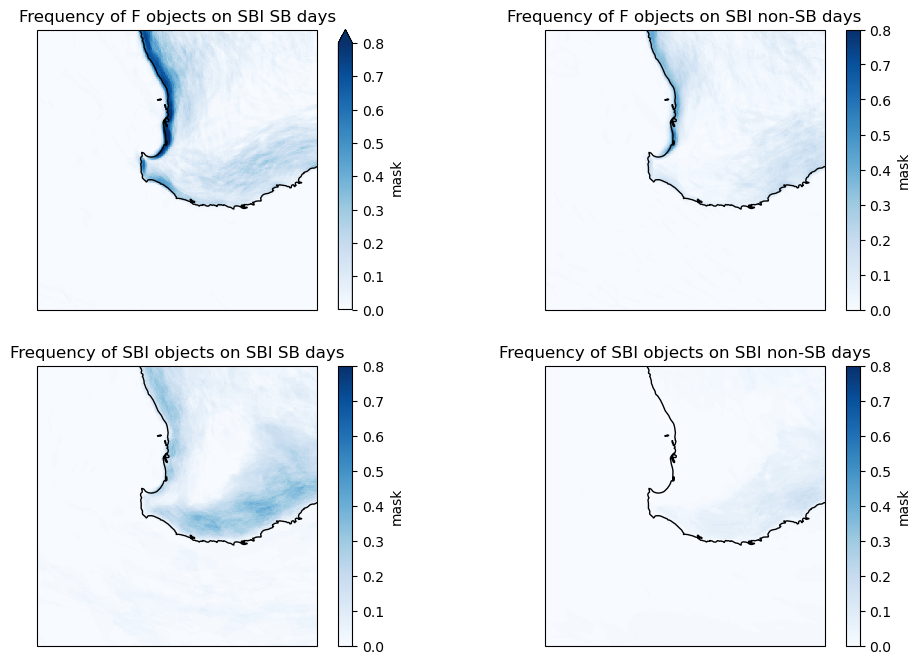

In [14]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI non-SB days")

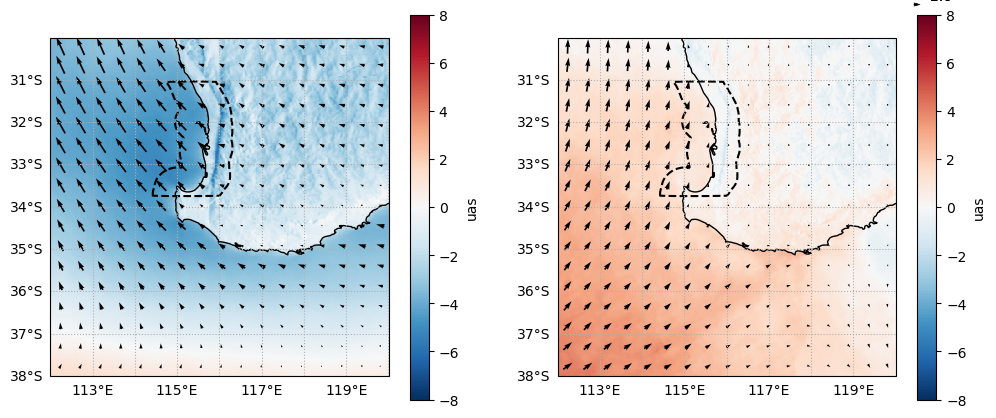

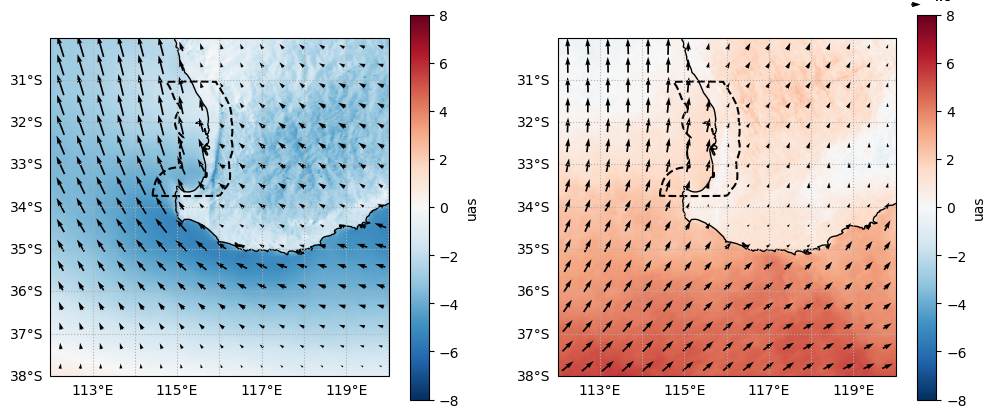

In [143]:
h = 4
s = 150
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")


h = 22
s = 150
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")

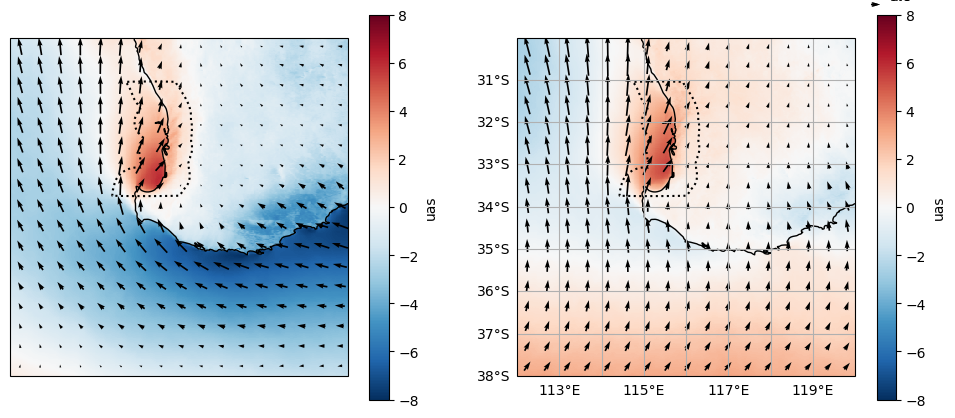

In [58]:
h = 16
s = 150
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])

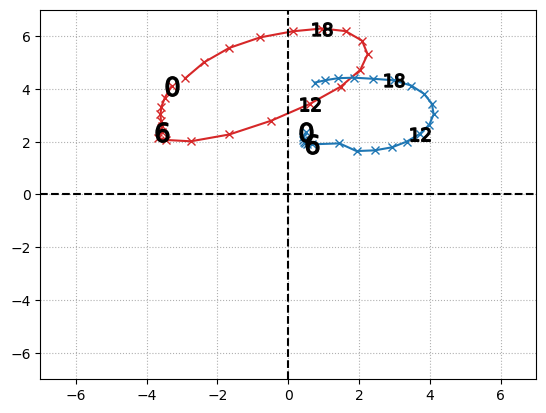

In [94]:
def plot_hodo(u,v,color="tab:blue"):
    u = u.values
    v = v.values
    plt.plot(u,v,color=color,marker="x")
    [plt.plot(u[i],v[i],color="k",marker="$"+str(i)+"$",ms=14) for i in [0,6,12,18]]
    

coastal_mask = (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop) & \
        (angle_ds.min_coast_dist<=50)

plot_hodo(
    xr.where(coastal_mask,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)

plot_hodo(
    xr.where(coastal_mask,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)

plt.ylim([-7,7])
plt.xlim([-7,7])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")

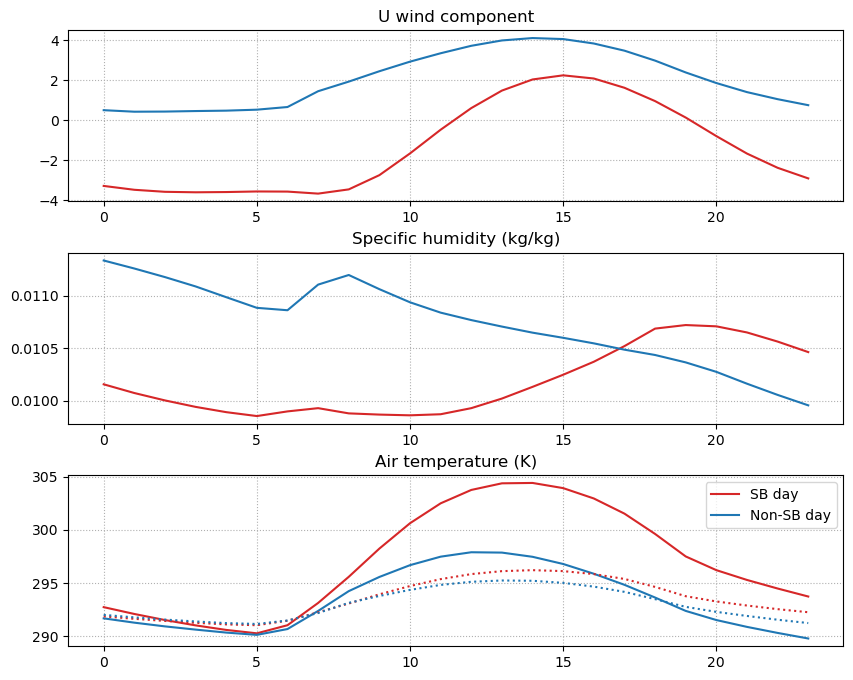

In [146]:
plt.figure(figsize=[10,8])
ax=plt.subplot(3,1,1)
xr.where(coastal_mask, F_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("U wind component")
ax=plt.subplot(3,1,2)
xr.where(coastal_mask, F_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Specific humidity (kg/kg)")
ax=plt.subplot(3,1,3)
l1=xr.where(coastal_mask & lsm, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
l2=xr.where(coastal_mask & lsm, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
xr.where(coastal_mask & lsm==0, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red",ls=":")
xr.where(coastal_mask & lsm==0, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue",ls=":")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Air temperature (K)")

plt.subplots_adjust(hspace=0.3)

plt.legend([l1[0],l2[0]],["SB day","Non-SB day"])

## Gippsland composite

In [4]:
sb_lat_slice, sb_lon_slice = utils.get_gippsland_bounds()
sb_lon_slice = slice(146.6,149.3)

lat_slice = slice(-42,-35)
lon_slice = slice(144.20,151.9)


F_hourly, F, sbi_hourly, sbi, angle_ds, lsm, orog, F_sb_ts, sbi_sb_ts, F_sb_comp, F_non_sb_comp, sbi_sb_comp, sbi_nonsb_comp = load_data(lat_slice,lon_slice,sb_lon_slice=sb_lon_slice,sb_lat_slice=sb_lat_slice)

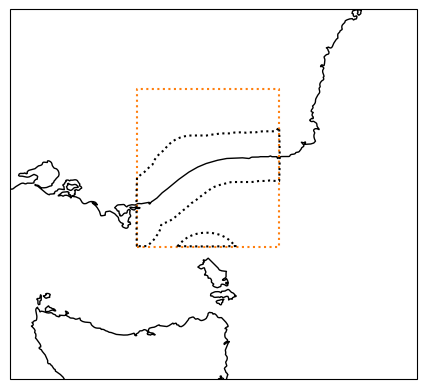

In [5]:
ax=plt.axes(projection=ccrs.PlateCarree())
plt.ylim([lat_slice.start,lat_slice.stop])
plt.xlim([lon_slice.start,lon_slice.stop])
ax.coastlines()

plt.plot(
    [sb_lon_slice.start,sb_lon_slice.stop,sb_lon_slice.stop,sb_lon_slice.start,sb_lon_slice.start],
    [sb_lat_slice.start,sb_lat_slice.start,sb_lat_slice.stop,sb_lat_slice.stop,sb_lat_slice.start],
    color="tab:orange",
    ls=":"
)
xr.plot.contour(
    xr.where(
    (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) &
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & 
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & 
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop),
    angle_ds.min_coast_dist,100),
    levels=[50],colors="k",linestyles=":")

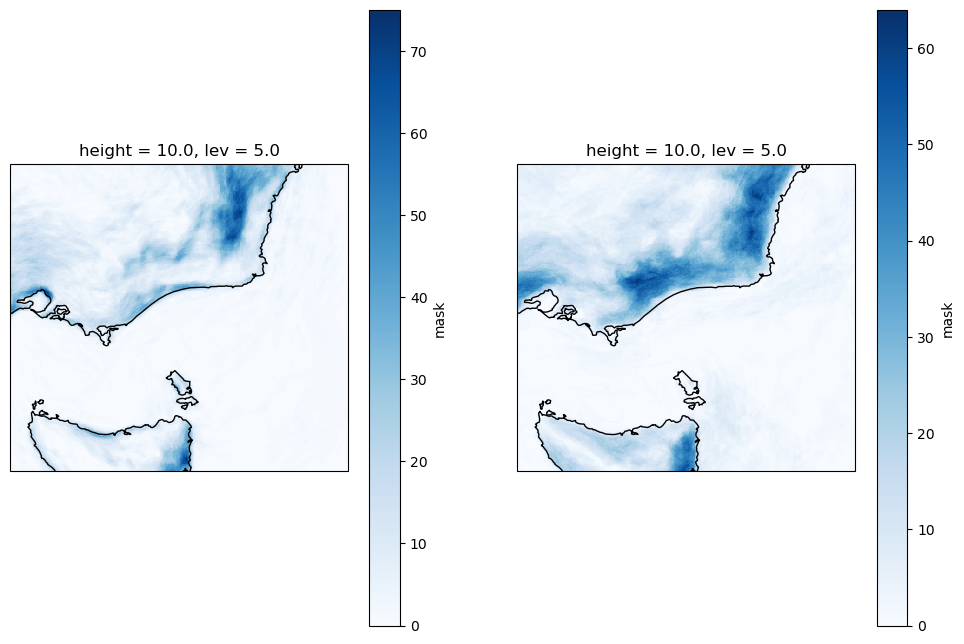

In [6]:
plt.figure(figsize=[12,8])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

In [8]:
print(F_sb_ts.sum(), sbi_sb_ts.sum(), F.date.shape[0])

125 116 181


Text(0.5, 1.0, 'Frequency of SBI objects on F non-SB days')

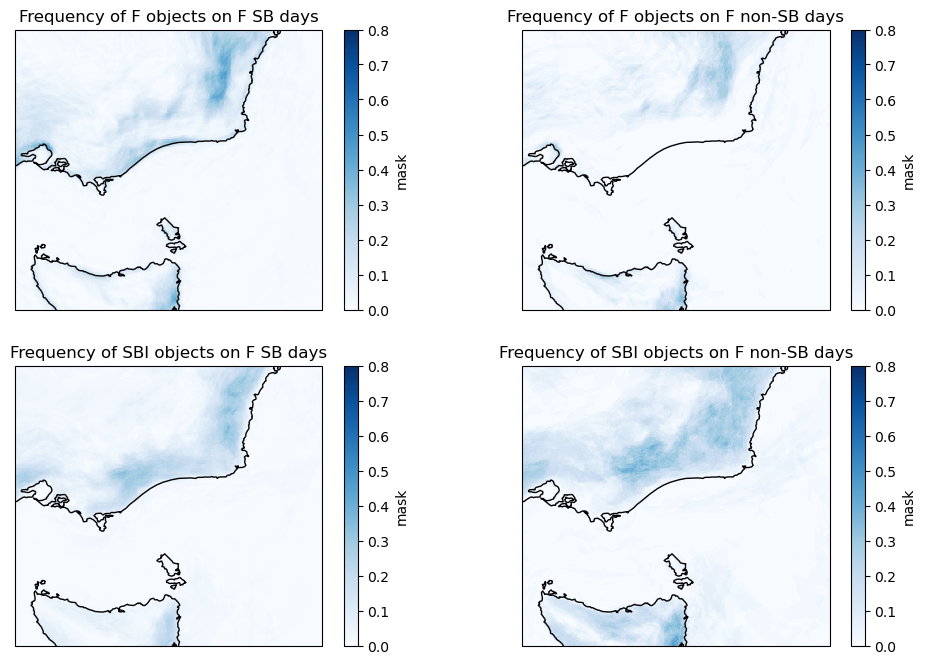

In [9]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F non-SB days")

Text(0.5, 1.0, 'Frequency of SBI objects on SBI non-SB days')

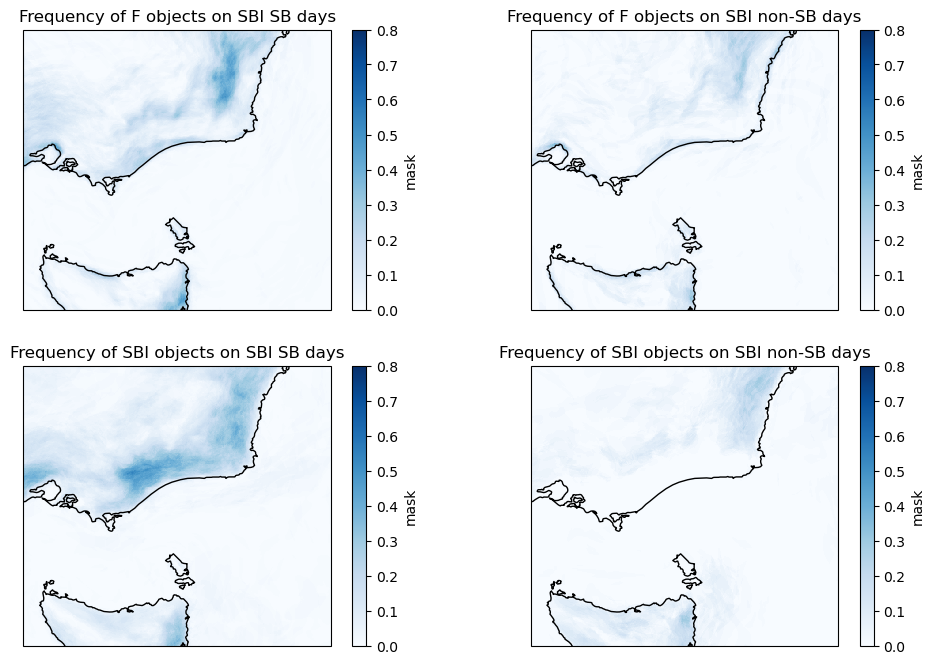

In [10]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI non-SB days")

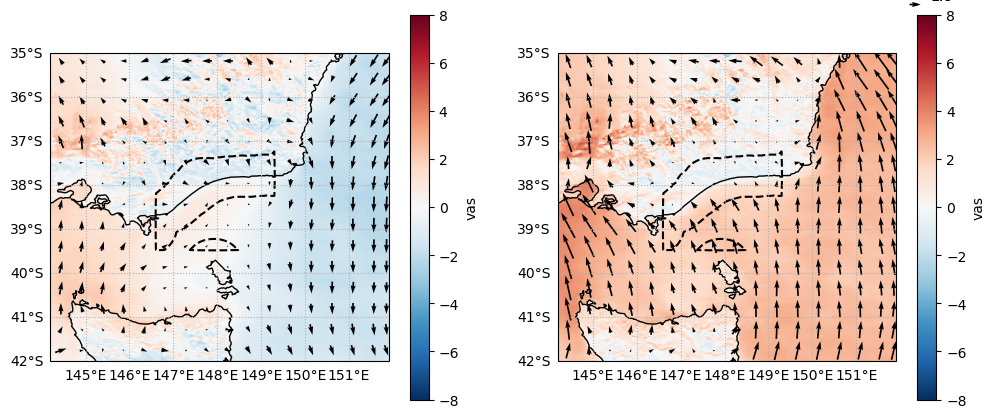

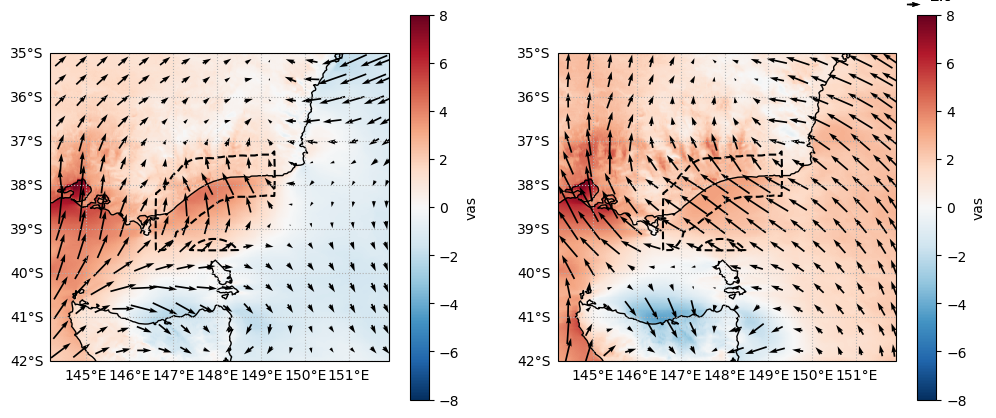

In [28]:
h = 4
s = 50
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")


h = 16
s = 50
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")




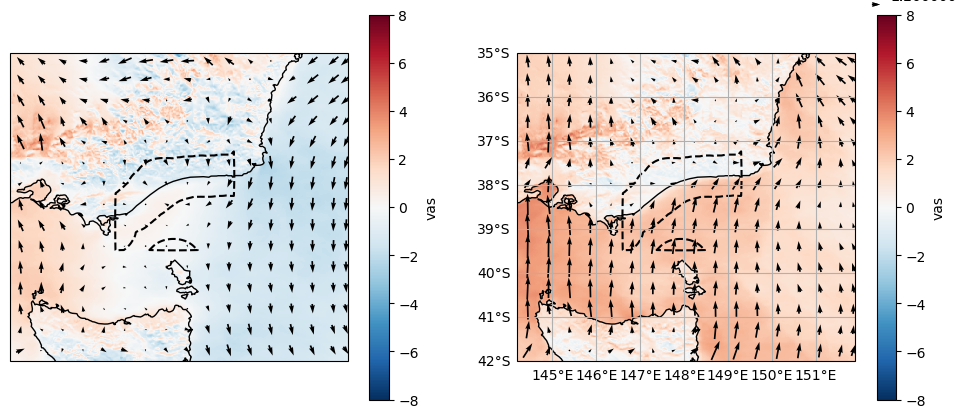

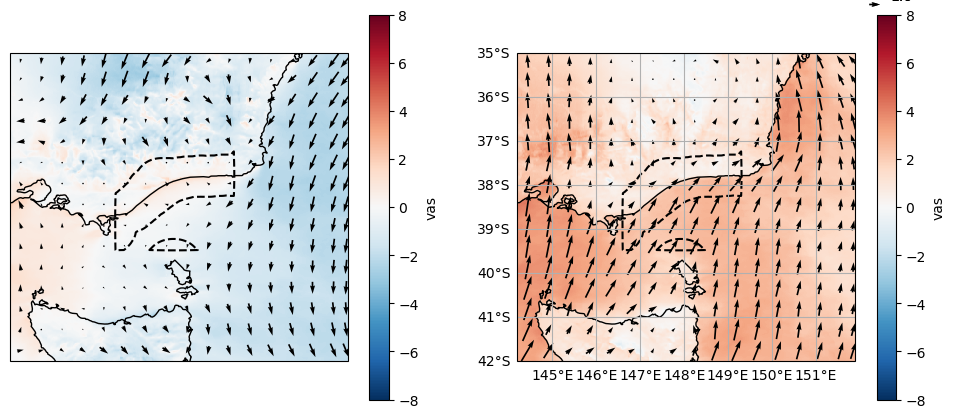

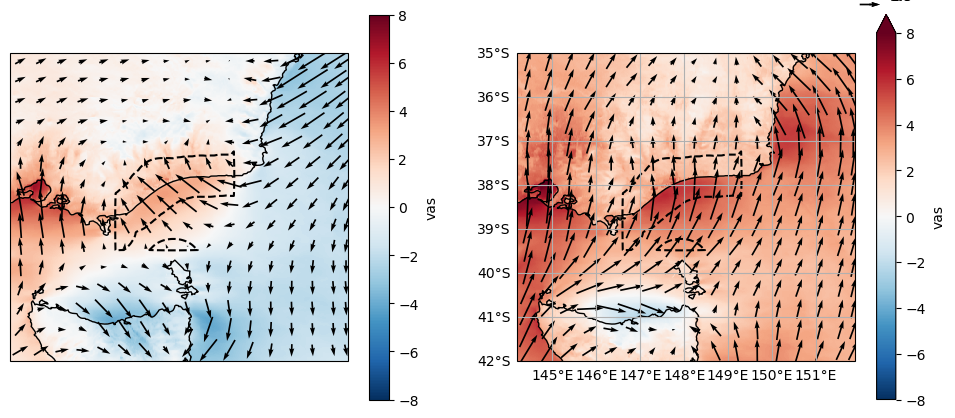

In [23]:
h = 3
s = 50
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])


h = 9
s = 50
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])


h = 15
s = 50
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["vas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])

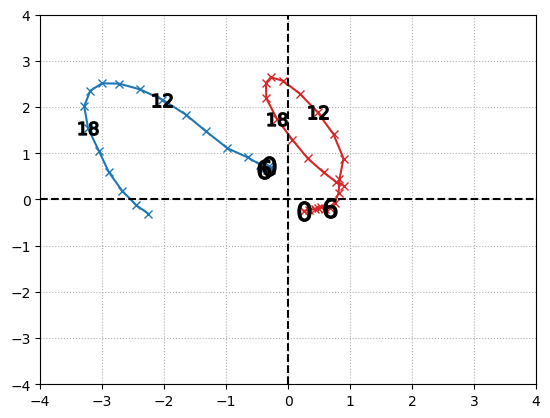

In [29]:
def plot_hodo(u,v,color="tab:blue",ls="-"):
    u = u.values
    v = v.values
    plt.plot(u,v,color=color,marker="x",ls=ls)
    [plt.plot(u[i],v[i],color="k",marker="$"+str(i)+"$",ms=14) for i in [0,6,12,18]]
    

coastal_mask = (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop) & \
        (angle_ds.min_coast_dist<=50)

plot_hodo(
    xr.where(coastal_mask,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_sb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_sb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:red",
#     ls=":"
# )

plot_hodo(
    xr.where(coastal_mask,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_nonsb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_nonsb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:blue",
#     ls=":"
# )

plt.ylim([-4,4])
plt.xlim([-4,4])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")

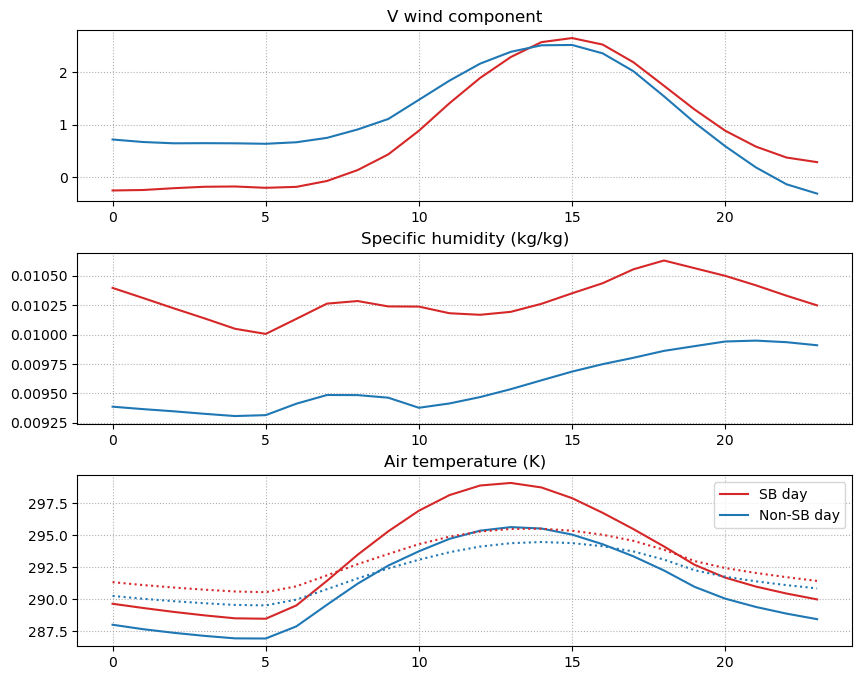

In [30]:
plt.figure(figsize=[10,8])
ax=plt.subplot(3,1,1)
xr.where(coastal_mask, F_sb_comp["vas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["vas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("V wind component")
ax=plt.subplot(3,1,2)
xr.where(coastal_mask, F_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Specific humidity (kg/kg)")
ax=plt.subplot(3,1,3)
l1=xr.where(coastal_mask & lsm, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
l2=xr.where(coastal_mask & lsm, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
xr.where(coastal_mask & lsm==0, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red",ls=":")
xr.where(coastal_mask & lsm==0, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue",ls=":")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Air temperature (K)")

plt.subplots_adjust(hspace=0.3)

plt.legend([l1[0],l2[0]],["SB day","Non-SB day"])

In [18]:
#uprime3d,vprime3d=sea_breeze_funcs.rotate_wind(ua,va,angle_ds.angle_interp)


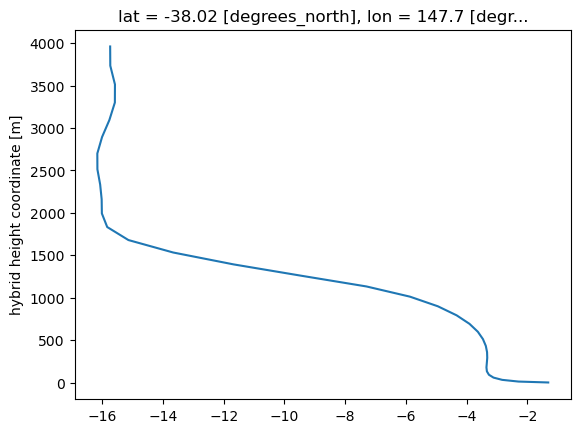

In [19]:
#vprime3d.sel(lat=-38.024375,lon=147.645359,method="nearest").isel(time=6).plot(y="lev")

In [64]:
# sb_hourly_times = (np.in1d(vprime3d.time.dt.date,sbi.date[sbi_sb_ts.astype(bool)]))
# vprime3d_sb = vprime3d.sel(time=sb_hourly_times).groupby("time.hour").mean().persist()

# nonsb_hourly_times = (np.in1d(vprime3d.time.dt.date,sbi.date[~sbi_sb_ts.astype(bool)]))
# vprime3d_nonsb = vprime3d.sel(time=nonsb_hourly_times).groupby("time.hour").mean().persist()


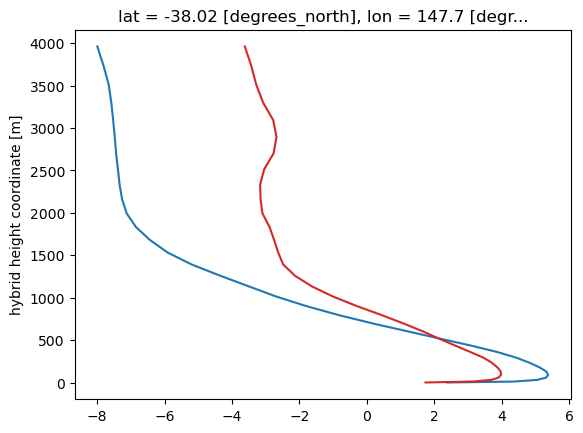

In [81]:
# h=4

# vprime3d_sb.sel(hour=h,lat=-38.024375,lon=147.645359,method="nearest").plot(y="lev",color="tab:blue")
# vprime3d_nonsb.sel(hour=h,lat=-38.024375,lon=147.645359,method="nearest").plot(y="lev",color="tab:red")


## Illawara

In [27]:
#m="barra_c"

lat_slice = slice(-40,-30)
lon_slice = slice(148,155.1)

sb_lat_slice = slice(-35,-32)
sb_lon_slice = slice(149,154)

F_hourly, F, sbi_hourly, sbi, angle_ds, lsm, orog, F_sb_ts, sbi_sb_ts, F_sb_comp, F_non_sb_comp, sbi_sb_comp, sbi_nonsb_comp = load_data(lat_slice,lon_slice,sb_lon_slice=sb_lon_slice,sb_lat_slice=sb_lat_slice)

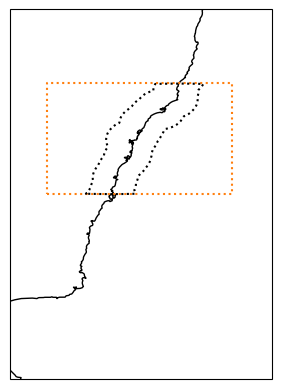

In [28]:
ax=plt.axes(projection=ccrs.PlateCarree())
plt.ylim([lat_slice.start,lat_slice.stop])
plt.xlim([lon_slice.start,lon_slice.stop])
ax.coastlines()

plt.plot(
    [sb_lon_slice.start,sb_lon_slice.stop,sb_lon_slice.stop,sb_lon_slice.start,sb_lon_slice.start],
    [sb_lat_slice.start,sb_lat_slice.start,sb_lat_slice.stop,sb_lat_slice.stop,sb_lat_slice.start],
    color="tab:orange",
    ls=":"
)

xr.plot.contour(
    xr.where(
    (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) &
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & 
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & 
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop),
    angle_ds.min_coast_dist,100),
    levels=[50],colors="k",linestyles=":")

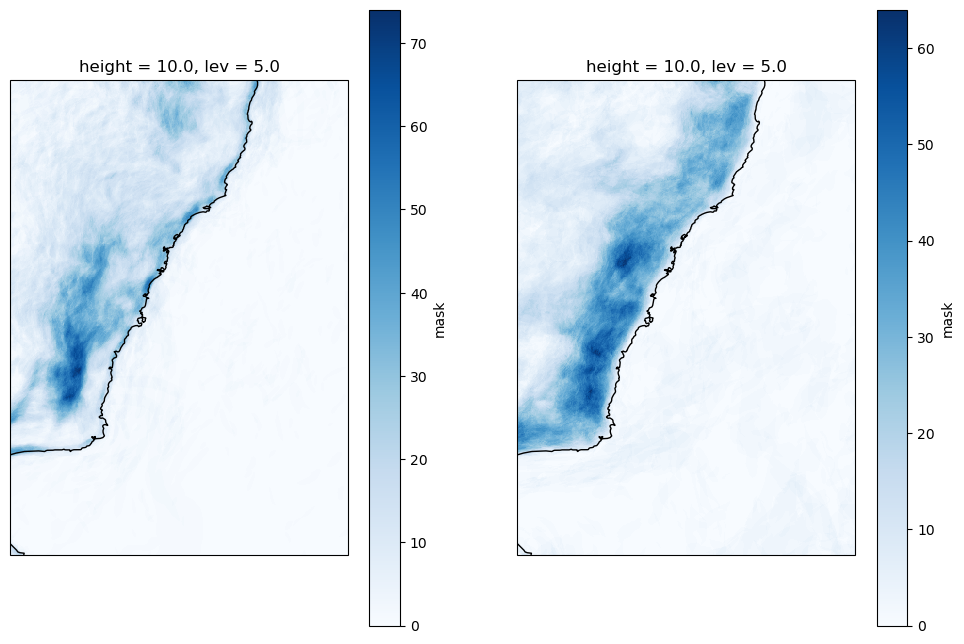

In [29]:
plt.figure(figsize=[12,8])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

In [30]:
print(F_sb_ts.sum(), sbi_sb_ts.sum(), F.date.shape[0])

147 110 181


Text(0.5, 1.0, 'Frequency of SBI objects on F non-SB days')

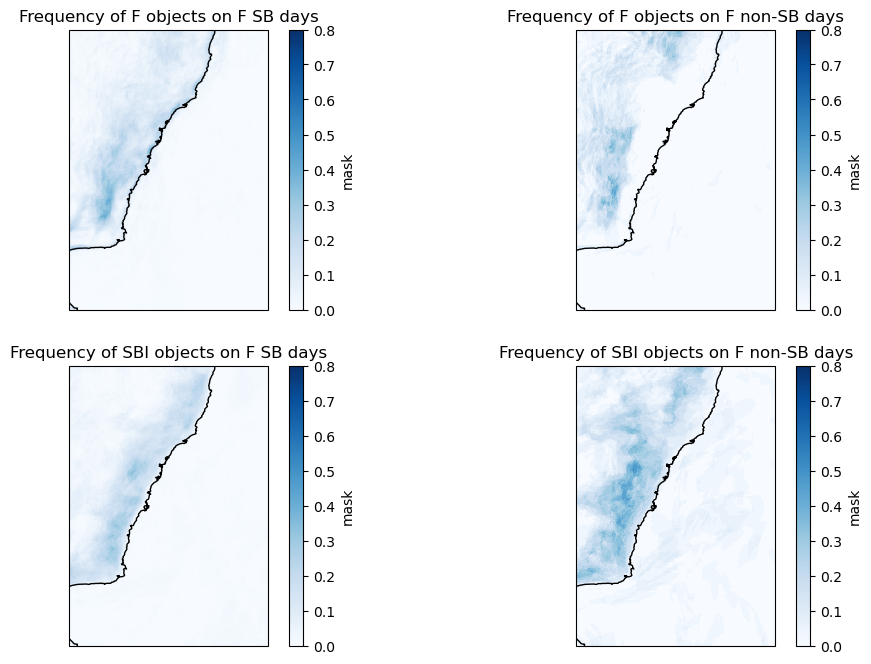

In [31]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F non-SB days")

Text(0.5, 1.0, 'Frequency of SBI objects on SBI non-SB days')

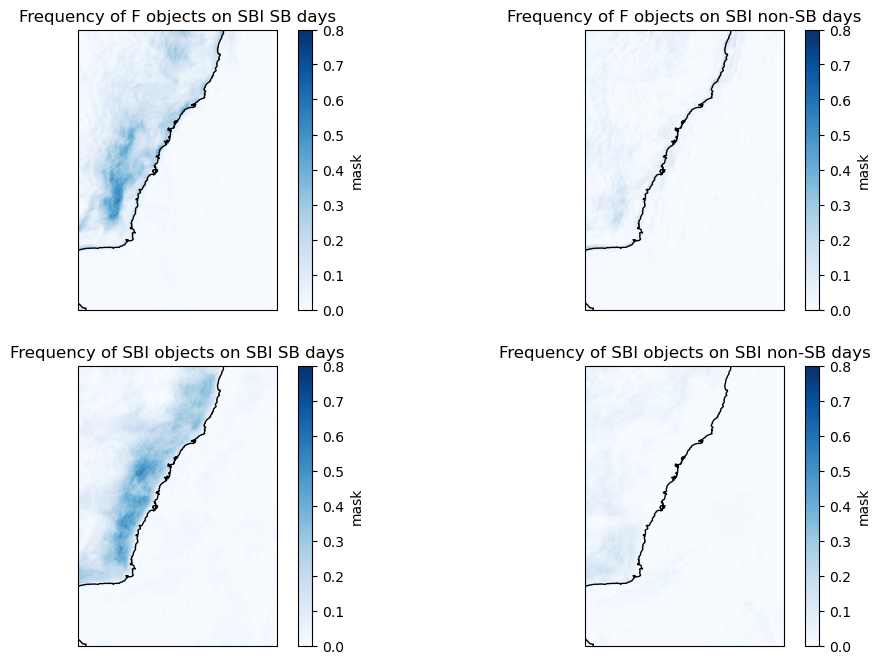

In [32]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI non-SB days")

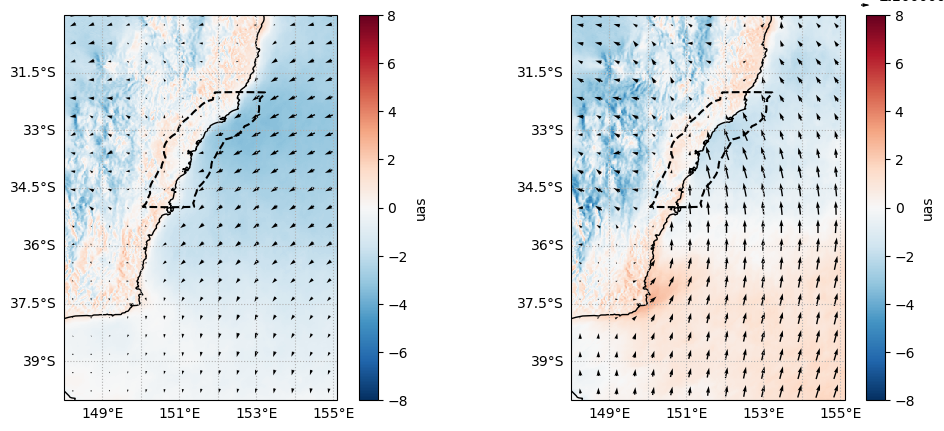

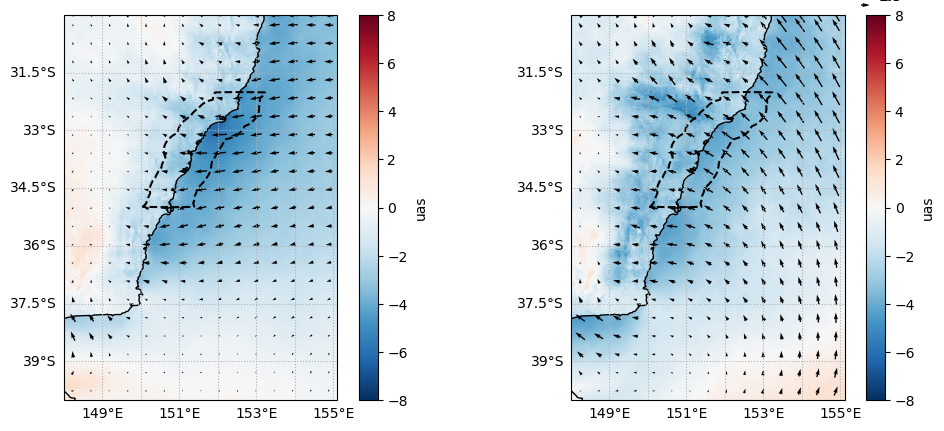

In [33]:
h = 4
s = 100
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")


h = 16
s = 100
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")

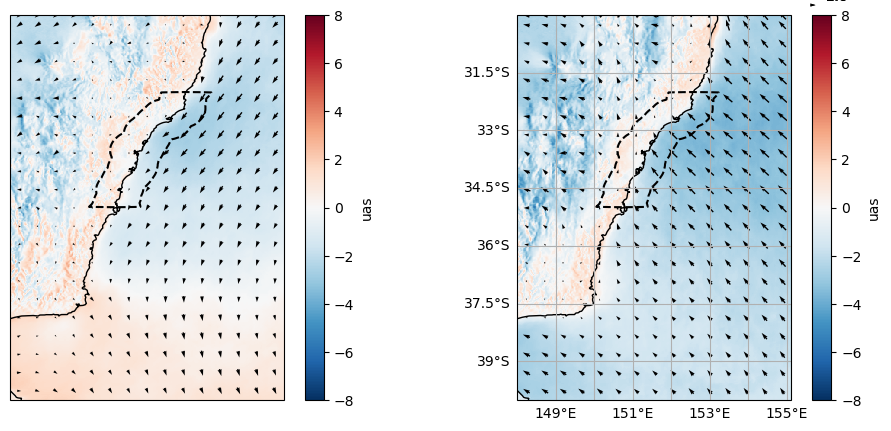

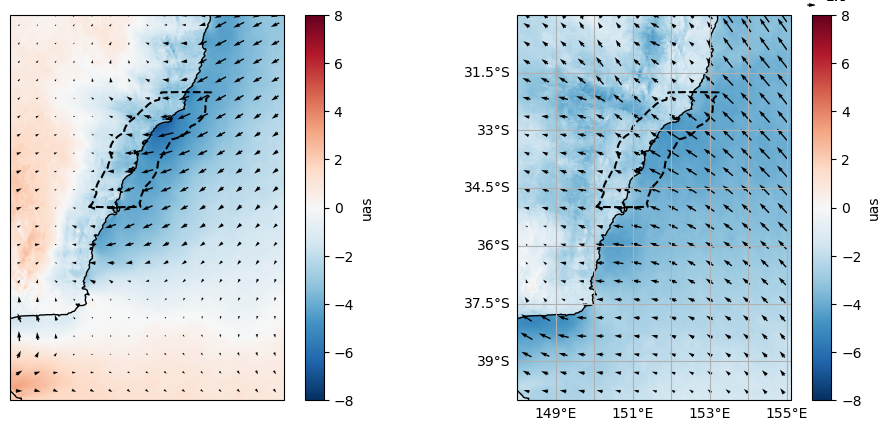

In [34]:
h = 4
s = 100
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])


h = 16
s = 100
c=24

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"])

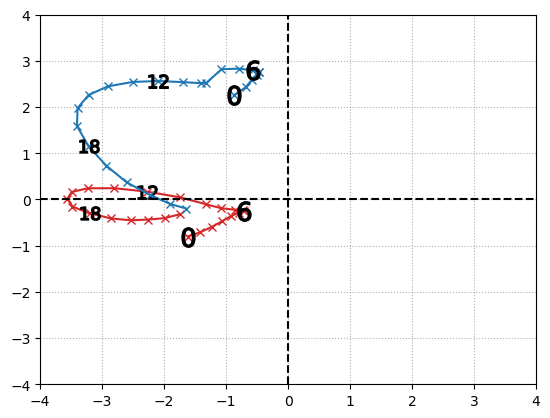

In [35]:
def plot_hodo(u,v,color="tab:blue",ls="-"):
    u = u.values
    v = v.values
    plt.plot(u,v,color=color,marker="x",ls=ls)
    [plt.plot(u[i],v[i],color="k",marker="$"+str(i)+"$",ms=14) for i in [0,6,12,18]]
    

coastal_mask = (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop) & \
        (angle_ds.min_coast_dist<=50)

plot_hodo(
    xr.where(coastal_mask,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_sb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_sb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:red",
#     ls=":"
# )

plot_hodo(
    xr.where(coastal_mask,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_nonsb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_nonsb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:blue",
#     ls=":"
# )

plt.ylim([-4,4])
plt.xlim([-4,4])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")

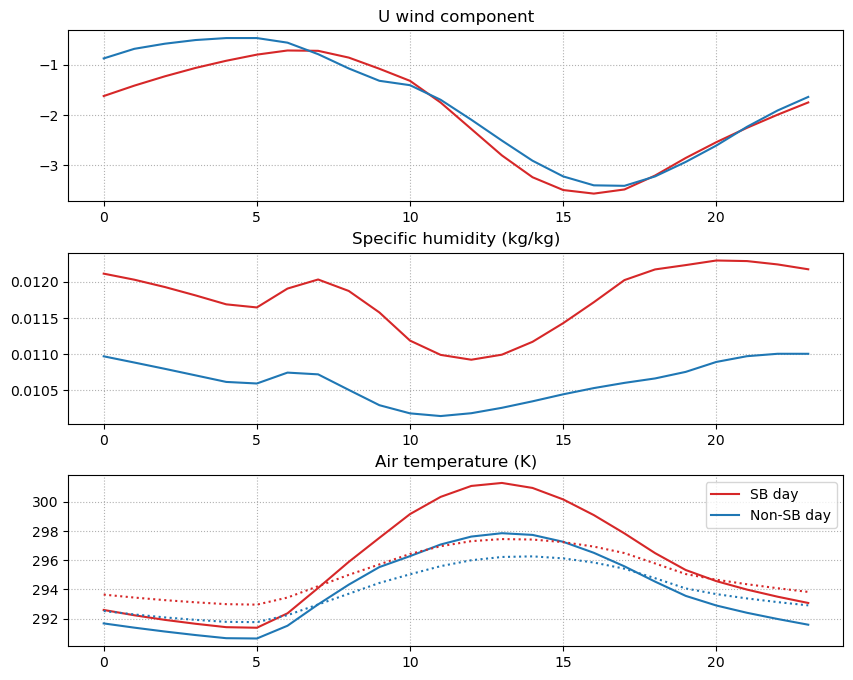

In [39]:
plt.figure(figsize=[10,8])
ax=plt.subplot(3,1,1)
xr.where(coastal_mask, F_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("U wind component")
ax=plt.subplot(3,1,2)
xr.where(coastal_mask & lsm, F_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask & lsm, F_non_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Specific humidity (kg/kg)")
ax=plt.subplot(3,1,3)
l1=xr.where(coastal_mask & lsm, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
l2=xr.where(coastal_mask & lsm, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
xr.where(coastal_mask & lsm==0, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red",ls=":")
xr.where(coastal_mask & lsm==0, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue",ls=":")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Air temperature (K)")

plt.subplots_adjust(hspace=0.3)

plt.legend([l1[0],l2[0]],["SB day","Non-SB day"])

In [4]:
lon_slice = slice(136,140)
lat_slice = slice(-37,-33)
sb_lat_slice = slice(-35.7,-34)
sb_lon_slice = slice(138.1,138.8)
F_hourly, F, sbi_hourly, sbi, angle_ds, lsm, orog, F_sb_ts, sbi_sb_ts, F_sb_comp, F_non_sb_comp, sbi_sb_comp, sbi_nonsb_comp = load_data(lat_slice,lon_slice,sb_lon_slice=sb_lon_slice,sb_lat_slice=sb_lat_slice)

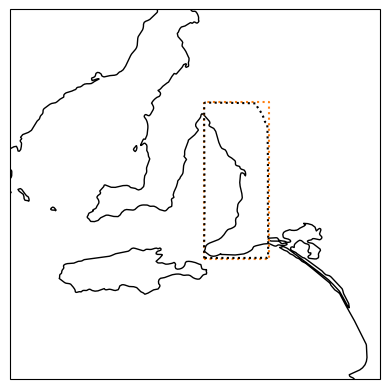

In [5]:

ax=plt.axes(projection=ccrs.PlateCarree())
plt.ylim([lat_slice.start,lat_slice.stop])
plt.xlim([lon_slice.start,lon_slice.stop])
ax.coastlines()

plt.plot(
    [sb_lon_slice.start,sb_lon_slice.stop,sb_lon_slice.stop,sb_lon_slice.start,sb_lon_slice.start],
    [sb_lat_slice.start,sb_lat_slice.start,sb_lat_slice.stop,sb_lat_slice.stop,sb_lat_slice.start],
    color="tab:orange",
    ls=":"
)
xr.plot.contour(
    xr.where(
    (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) &
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & 
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & 
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop),
    angle_ds.min_coast_dist,100),
    levels=[50],colors="k",linestyles=":")

In [6]:
print(F_sb_ts.sum(), sbi_sb_ts.sum(), F.date.shape[0])

158 80 181


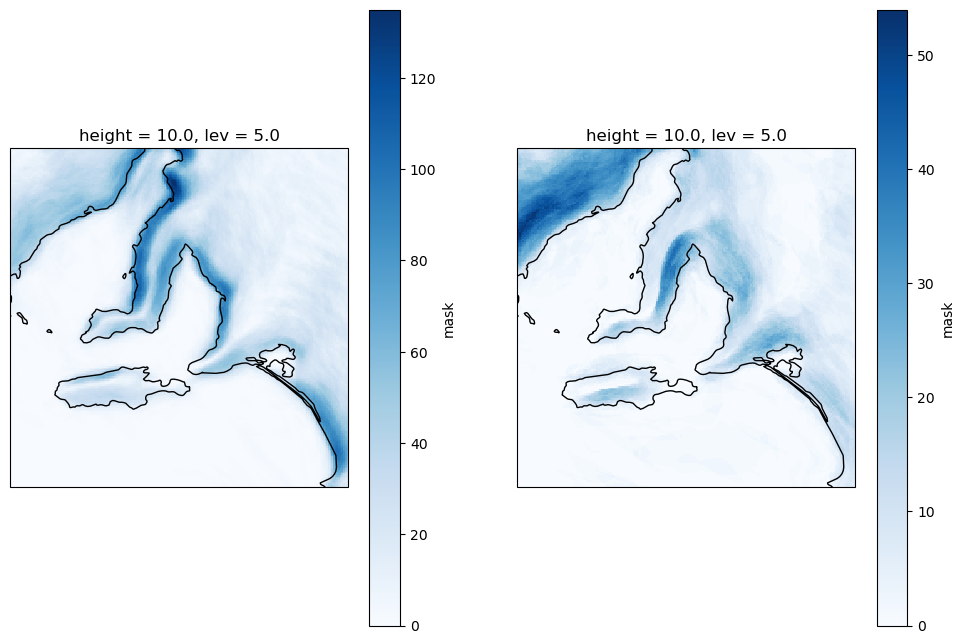

In [85]:
plt.figure(figsize=[12,8])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi.mask.sum("date").plot(cmap="Blues")
ax.coastlines()

Text(0.5, 1.0, 'Frequency of SBI objects on F non-SB days')

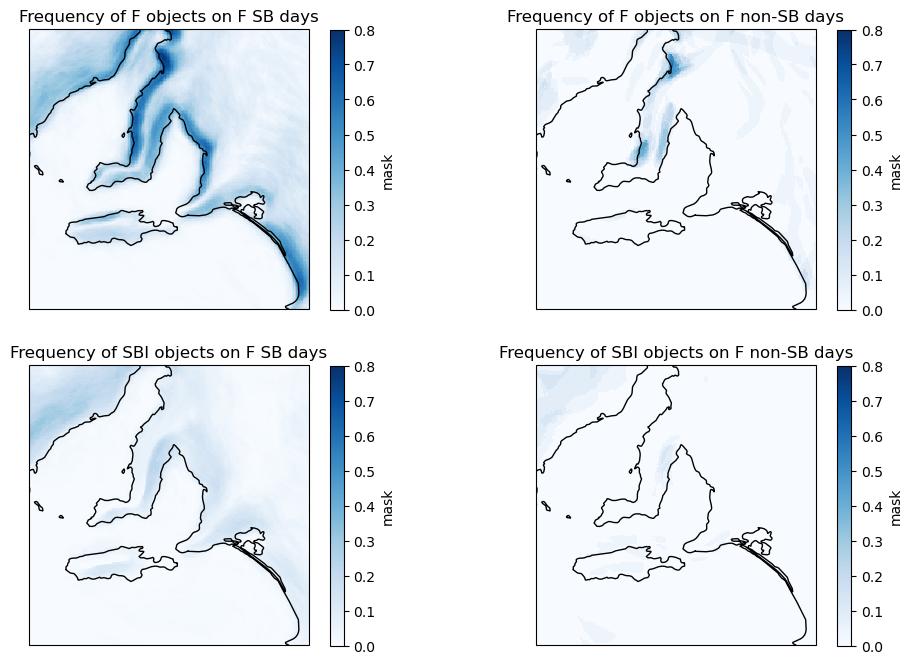

In [86]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on F non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~F_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on F non-SB days")

Text(0.5, 1.0, 'Frequency of SBI objects on SBI non-SB days')

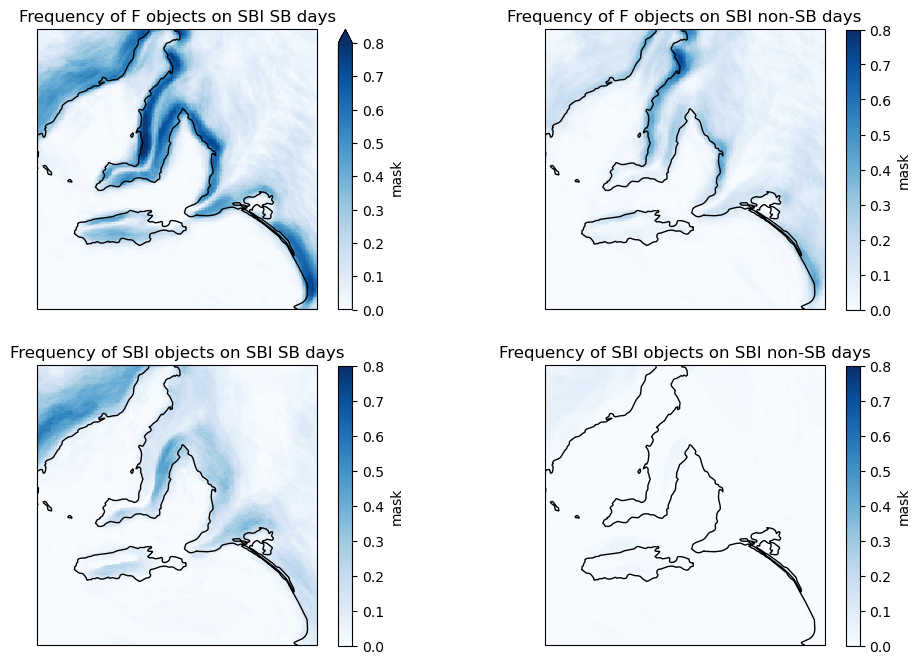

In [87]:
plt.figure(figsize=[12,8])
ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
F.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI SB days")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
F.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of F objects on SBI non-SB days")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
sbi.sel(date=sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI SB days")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
sbi.sel(date=~sbi_sb_ts).mask.mean("date").plot(vmax=0.8,cmap="Blues")
ax.coastlines()
plt.title("Frequency of SBI objects on SBI non-SB days")

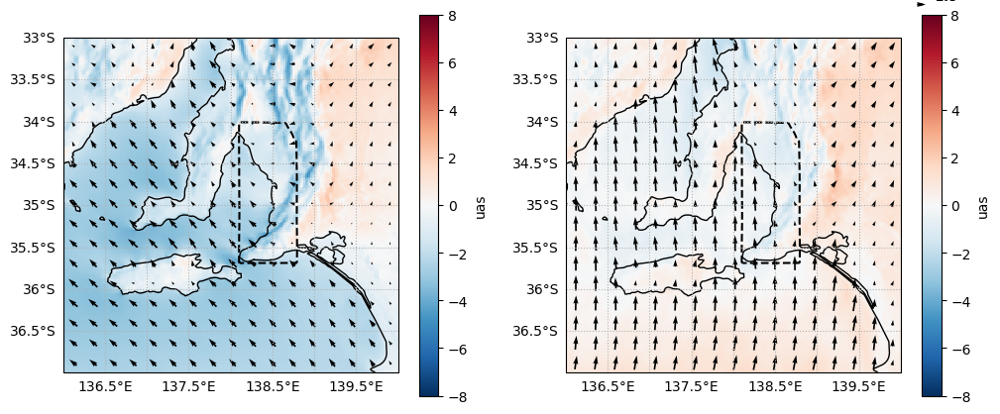

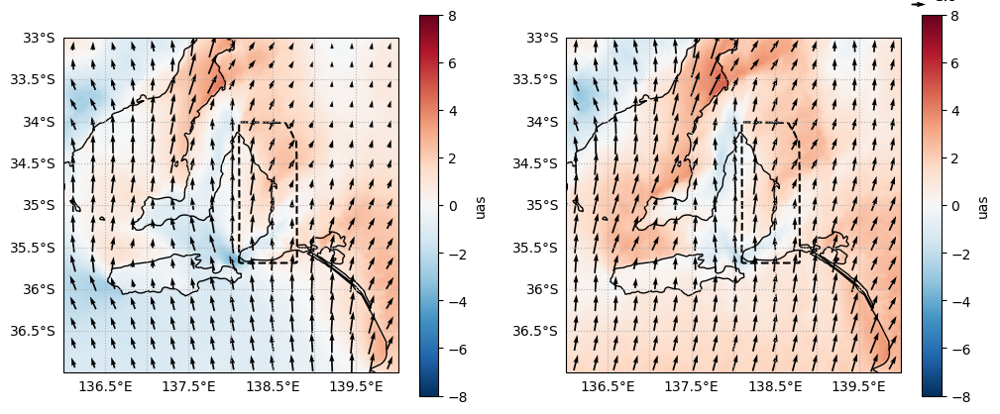

In [7]:

h = 4
s = 120
c=12

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")


h = 16
s = 120
c=12

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
F_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_sb_comp["uas"],
    "v":F_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)
ax.gridlines(draw_labels=["left","bottom"],ls=":")

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
F_non_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":F_non_sb_comp["uas"],
    "v":F_non_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax.gridlines(draw_labels=["left","bottom"],ls=":")

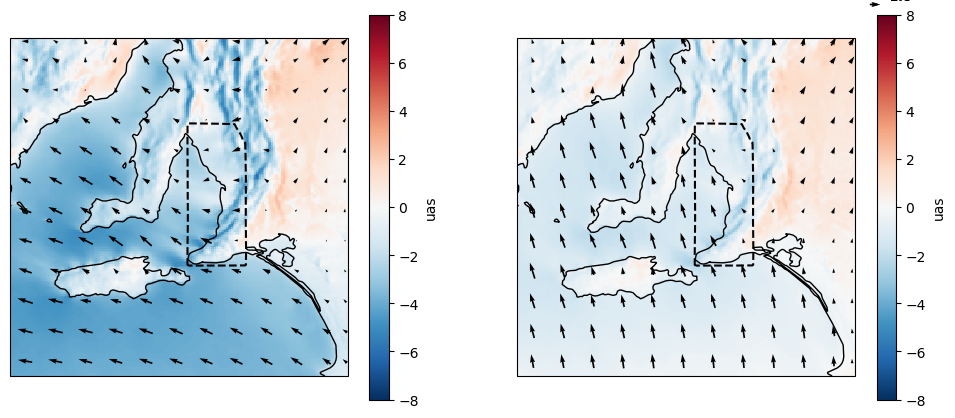

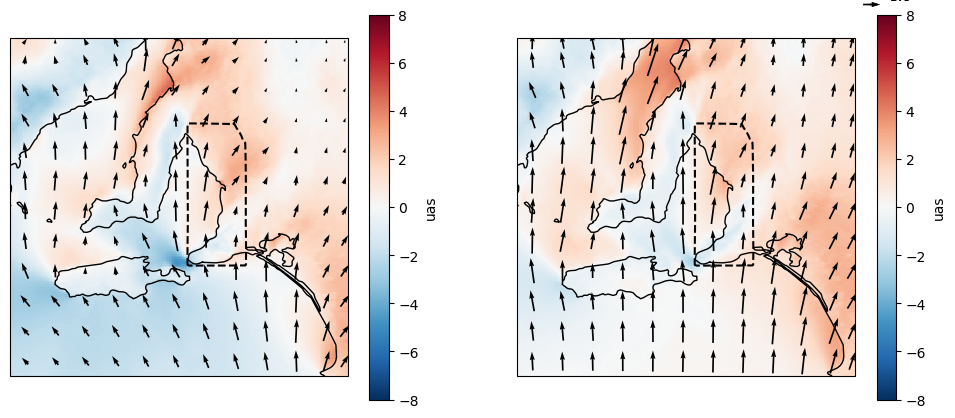

In [8]:
h = 4
s = 100
c=18

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)



h = 16
s = 100
c=18

plt.figure(figsize=[12,5])
ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
sbi_sb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_sb_comp["uas"],
    "v":sbi_sb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
sbi_nonsb_comp["uas"].sel(hour=h).plot(cmap="RdBu_r",ax=ax,vmin=-8,vmax=8)
xr.Dataset({
    "u":sbi_nonsb_comp["uas"],
    "v":sbi_nonsb_comp["vas"]}).coarsen({"lat":c,"lon":c},boundary="pad").mean().sel(hour=h).plot.quiver(
    x="lon",y="lat",u="u",v="v",ax=ax,width=0.005,scale=s)
ax.coastlines()
plot_sbdays_box(angle_ds,sb_lat_slice,sb_lon_slice)



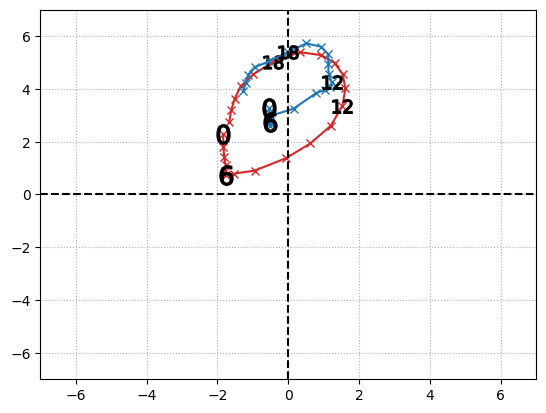

In [9]:
def plot_hodo(u,v,color="tab:blue",ls="-"):
    u = u.values
    v = v.values
    plt.plot(u,v,color=color,marker="x",ls=ls)
    [plt.plot(u[i],v[i],color="k",marker="$"+str(i)+"$",ms=14) for i in [0,6,12,18]]
    

coastal_mask = (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop) & \
        (angle_ds.min_coast_dist<=50)

plot_hodo(
    xr.where(coastal_mask,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_sb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_sb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:red",
#     ls=":"
# )

plot_hodo(
    xr.where(coastal_mask,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)

# plot_hodo(
#     xr.where(coastal_mask,sbi_nonsb_comp["uas"],np.nan).mean(("lat","lon")),
#     xr.where(coastal_mask,sbi_nonsb_comp["vas"],np.nan).mean(("lat","lon")),
#     color="tab:blue",
#     ls=":"
# )

plt.ylim([-7,7])
plt.xlim([-7,7])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")

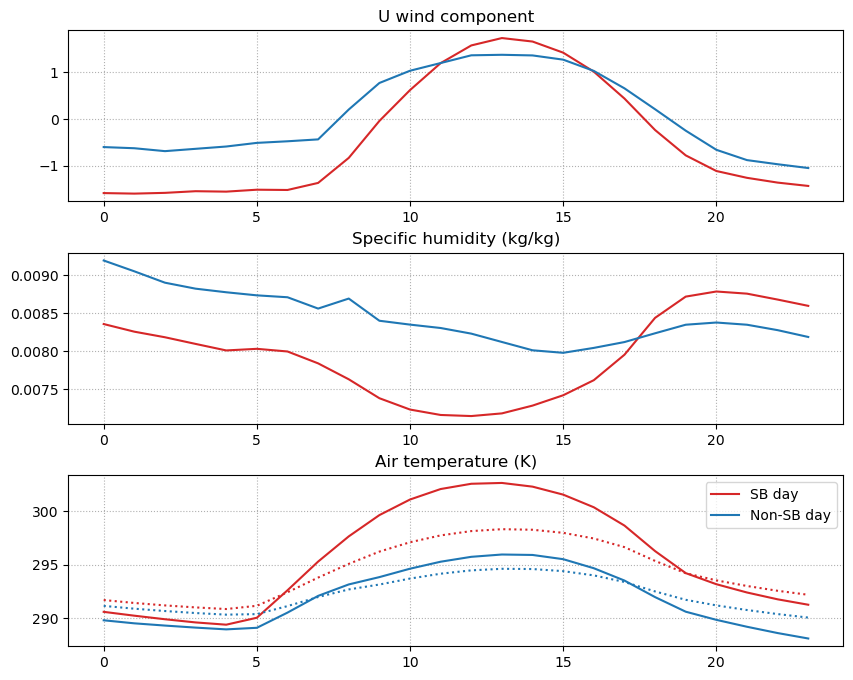

In [26]:
plt.figure(figsize=[10,8])
ax=plt.subplot(3,1,1)
xr.where(coastal_mask, F_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask, F_non_sb_comp["uas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("U wind component")
ax=plt.subplot(3,1,2)
xr.where(coastal_mask & lsm, F_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:red")
xr.where(coastal_mask & lsm, F_non_sb_comp["hus"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Specific humidity (kg/kg)")
ax=plt.subplot(3,1,3)
l1=xr.where(coastal_mask & lsm, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red")
l2=xr.where(coastal_mask & lsm, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue")
xr.where(coastal_mask & lsm==0, F_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:red",ls=":")
xr.where(coastal_mask & lsm==0, F_non_sb_comp["tas"], np.nan).mean(("lat","lon")).plot(color="tab:blue",ls=":")
ax.grid(ls=":")
ax.set_xlabel("")
ax.set_title("Air temperature (K)")

plt.subplots_adjust(hspace=0.3)

plt.legend([l1[0],l2[0]],["SB day","Non-SB day"])

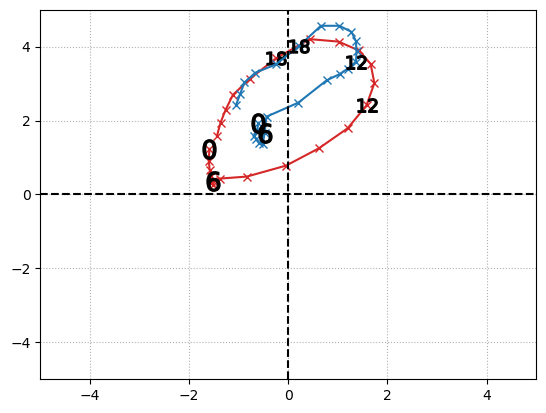

In [23]:
coastal_mask = (angle_ds.min_coast_dist.lat<sb_lat_slice.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice.stop) & \
        (angle_ds.min_coast_dist<=50) & lsm

plot_hodo(
    xr.where(coastal_mask,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)


plot_hodo(
    xr.where(coastal_mask,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)

plt.ylim([-5,5])
plt.xlim([-5,5])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")

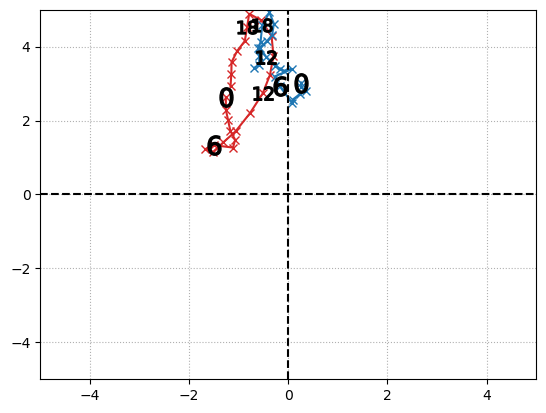

In [25]:

sb_lat_slice_e = slice(-35.4,-34.4)
sb_lon_slice_e = slice(137.6,138.1)

coastal_mask2 = (angle_ds.min_coast_dist.lat<sb_lat_slice_e.stop) & \
        (angle_ds.min_coast_dist.lat>sb_lat_slice_e.start) & \
        (angle_ds.min_coast_dist.lon>sb_lon_slice_e.start) & \
        (angle_ds.min_coast_dist.lon<sb_lon_slice_e.stop) & \
        (angle_ds.min_coast_dist<=50) & lsm

plot_hodo(
    xr.where(coastal_mask2,F_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask2,F_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:red"
)

plot_hodo(
    xr.where(coastal_mask2,F_non_sb_comp["uas"],np.nan).mean(("lat","lon")),
    xr.where(coastal_mask2,F_non_sb_comp["vas"],np.nan).mean(("lat","lon")),
    color="tab:blue"
)


plt.ylim([-5,5])
plt.xlim([-5,5])
plt.gca().axhline(ls="--",color="k")
plt.gca().axvline(ls="--",color="k")
plt.gca().grid(ls=":")